In [1]:
!pip install pydicom


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install nibabel


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import nibabel as nib

In [4]:
path="archive1/MICCAI_BraTS_2019_Data_Training/HGG/BraTS19_2013_3_1/BraTS19_2013_3_1_seg.nii"

In [5]:
import nibabel as nib

# Load the image
img = nib.load('archive1/MICCAI_BraTS_2019_Data_Training/HGG/BraTS19_2013_3_1/BraTS19_2013_3_1_seg.nii')

# Get the header
header = img.header

# Print the voxel sizes
print(header.get_zooms())

(1.0, 1.0, 1.0)


In [6]:
img = nib.load(path).get_fdata()
img.shape

(240, 240, 155)

In [7]:
from glob import glob
import matplotlib.pylab as plt

import pydicom as dicom

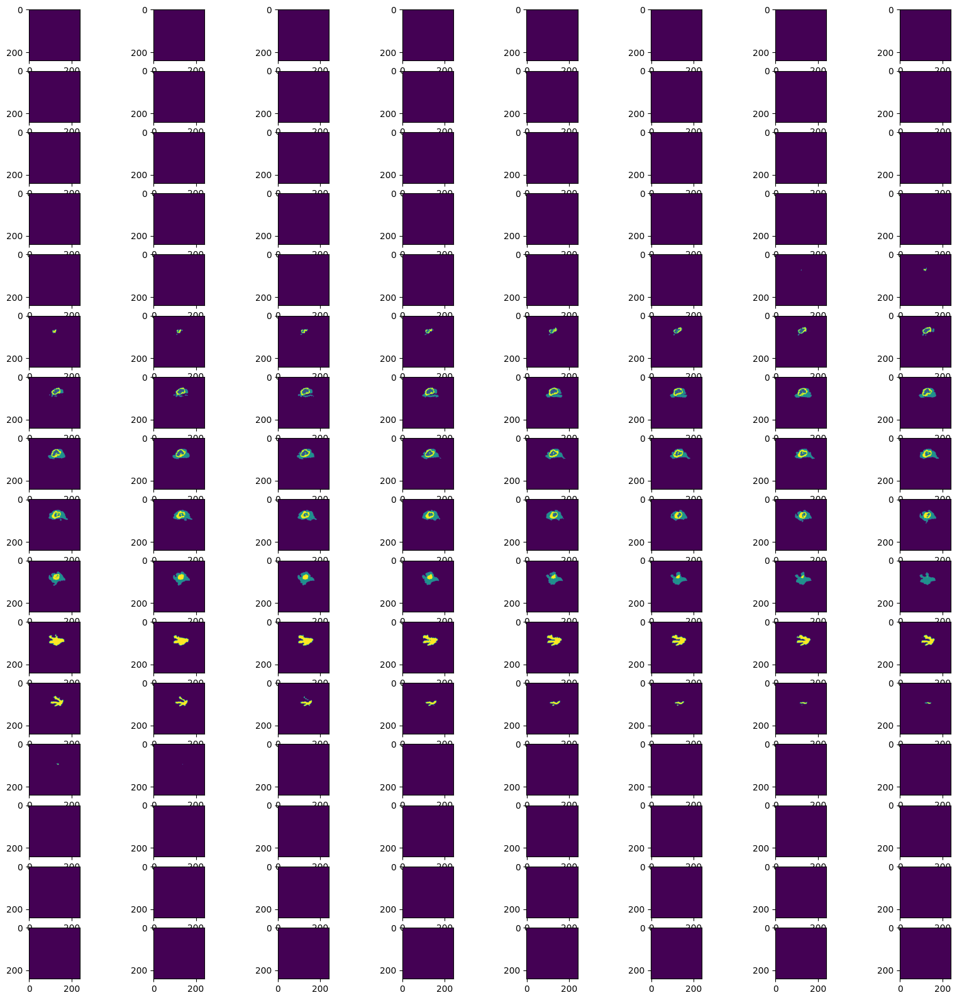

In [8]:
plt.style.use('default')
fig, axes = plt.subplots(16,8, figsize=(20,20))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img[:,:,1 + i])
plt.show()

In [9]:
def highlight_segments(image, segments, segments_to_highlight, highlight_color=[1, 0, 0]):
    """
    Highlight specific segments in an image.
    
    Parameters:
        image (numpy.ndarray): The input image.
        segments (numpy.ndarray): The segmentation map.
        segments_to_highlight (list): List of segment labels to highlight.
        highlight_color (list): RGB color to use for highlighting.
    
    Returns:
        numpy.ndarray: Image with highlighted segments.
    """
    highlight_mask = np.isin(segments, segments_to_highlight)

    highlighted_image = image.copy()
    highlighted_image[highlight_mask] = highlight_color

    return highlighted_image

(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 24

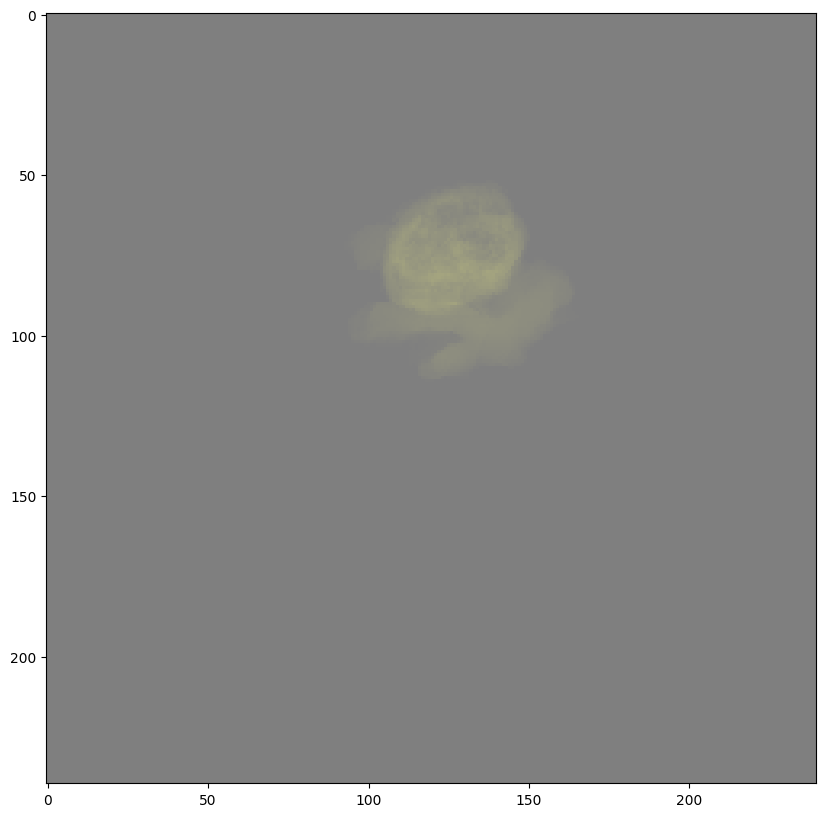

In [10]:
plt.style.use('default')
fig, ax = plt.subplots(figsize=(10,10))
for i in range(16*8):
    ax.imshow(img[:,:,1 + i], alpha=0.005) 
    print(img.shape) # alpha is for transparency
plt.show()

In [11]:
import os
import gc
from torch import nn
import torch.nn.functional as f
import torch
import torchio as tio
from torch.utils.data import DataLoader
import numpy as np
import wandb
from tqdm import tqdm
import matplotlib.pyplot as plt
from skimage.util import montage

c:\g\pproject\aimbot\bot\bot\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
!pip install wandb



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [13]:
!pip install torchio


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
data_dir = 'archive1/MICCAI_BraTS_2019_Data_Training/HGG'
Patient_info = [(f.path, f.name) for f in (os.scandir(data_dir)) if f.is_dir()]
sorted_patient_info = sorted(Patient_info, key=lambda param: param[1])
Patient_paths, Patient_names = zip(*sorted_patient_info)
subjects = []
for path, name in tqdm(zip(Patient_paths[:200], Patient_names[:200])):
    subject = tio.Subject(
        image=tio.ScalarImage(f"{path}/{name}_t1ce.nii"),
        label=tio.LabelMap(f"{path}/{name}_seg.nii"))
    lbl_temp = subject['label'][tio.DATA]
    subject['label'][tio.DATA] = np.concatenate((lbl_temp == 2, (lbl_temp == 1) | (lbl_temp == 4)), axis=0).astype(np.float32)
    subject['image'][tio.DATA] = subject['image'][tio.DATA].to(torch.float32)
    
    subjects.append(subject)
dataset = tio.SubjectsDataset(subjects)
print('Dataset size:', len(dataset), 'subjects')

0it [00:00, ?it/s]

200it [00:41,  4.85it/s]

Dataset size: 200 subjects


In [15]:
training_transform = tio.Compose([
    # tio.CropOrPad((240, 240, 128)),
    # tio.Resize((128, 128, 128)),
    tio.ZNormalization(masking_method=tio.ZNormalization.mean),
    tio.RescaleIntensity((0, 1), (0, 100)),
    tio.RandomNoise(p=0.2),
    tio.RandomFlip(),
    tio.OneOf({
        tio.RandomAffine(): 0.8,
        tio.RandomElasticDeformation(): 0.2,
    }),
])

validation_transform = tio.Compose([
    # tio.CropOrPad((240, 240, 128)),
    # tio.Resize((128, 128, 128)),
    tio.ZNormalization(masking_method=tio.ZNormalization.mean),
    tio.RescaleIntensity((0, 1), (0, 100)),
    # tio.OneHot(),
])

training_split_ratio = 0.8

num_sub = len(dataset)
num_train = int(training_split_ratio * num_sub)

training_subjects, validation_subjects = torch.utils.data.random_split(dataset, [num_train, num_sub - num_train])
training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

training_batch_size = 1
validation_batch_size = 1

train_dataloader = DataLoader(training_set, batch_size=training_batch_size)
val_dataloader = DataLoader(validation_set, batch_size=validation_batch_size)

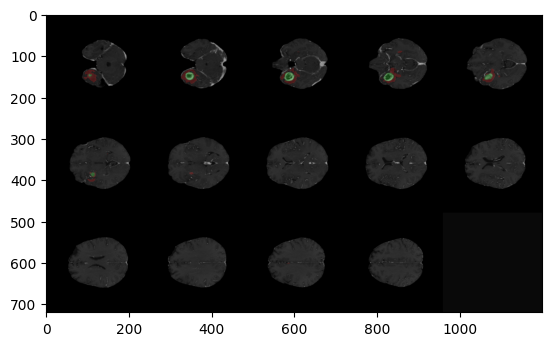

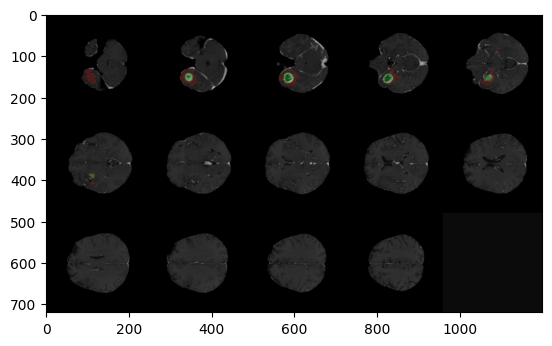

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


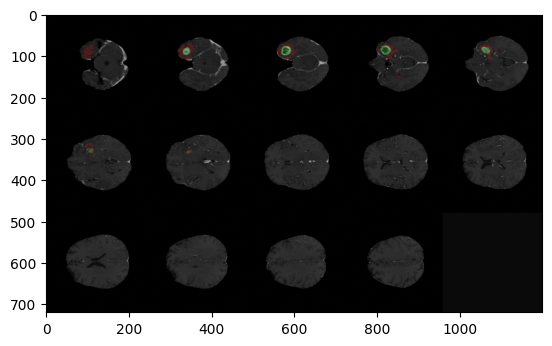

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


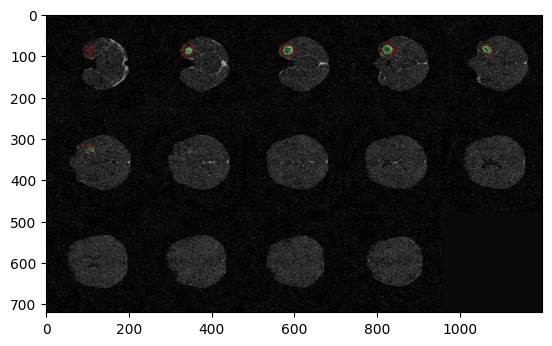

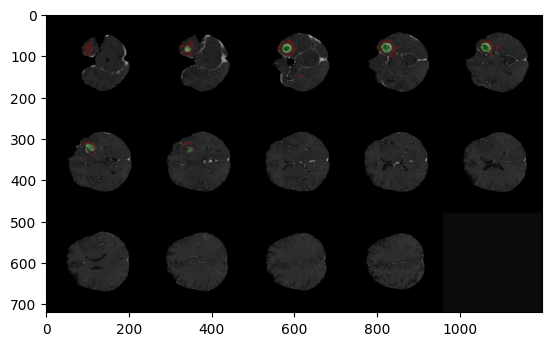

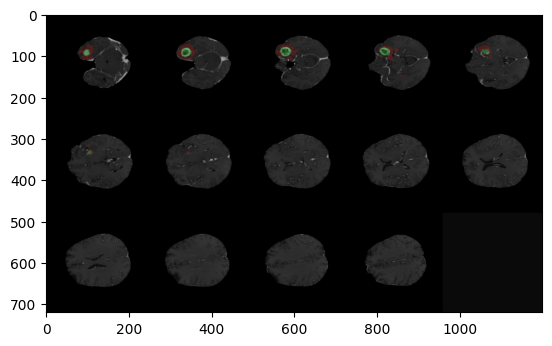

In [16]:
color_img = np.zeros([1, 240, 240, 155, 3])
color_mask = np.zeros([1, 240, 240, 155, 3])
l=[0,1,2,3,4,5]
for k in l:
    train_sample = next(iter(train_dataloader))
    x = train_sample['image'][tio.DATA]
    y = train_sample['label'][tio.DATA]

    color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
    for i in range(2):
        color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
    mixed = 0.8*color_img + 0.2*color_mask
    slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
    plt.imshow(montage(slices, channel_axis=3, grid_shape=(3,5)), cmap='gray')
    plt.show()

In [17]:
# data_dir = 'archive1/MICCAI_BraTS_2019_Data_Training/HGG'
# Patient_info = [(f.path, f.name) for f in (os.scandir(data_dir)) if f.is_dir()]
# sorted_patient_info = sorted(Patient_info, key=lambda param: param[1])
# Patient_paths, Patient_names = zip(*sorted_patient_info)
# subjects = []
# for path, name in tqdm(zip(Patient_paths[:200], Patient_names[:200])):
#     subject = tio.Subject(
#         image=tio.ScalarImage(f"{path}/{name}_t1ce.nii"),
#         label=tio.LabelMap(f"{path}/{name}_seg.nii"))
#     lbl_temp = subject['label'][tio.DATA]
#     subject['label'][tio.DATA] = np.concatenate((lbl_temp == 2, (lbl_temp == 1) | (lbl_temp == 4)), axis=0).astype(np.float32)
#     subject['image'][tio.DATA] = subject['image'][tio.DATA].to(torch.float32)
    
#     subjects.append(subject)
# dataset = tio.SubjectsDataset(subjects)
# print('Dataset size:', len(dataset), 'subjects')





# training_transform = tio.Compose([
#     tio.CropOrPad((240, 240, 128)),
#     tio.Resize((128, 128, 128)),
#     tio.ZNormalization(masking_method=tio.ZNormalization.mean),
#     tio.RescaleIntensity((0, 1), (0, 100)),
#     tio.RandomNoise(p=0.2),
#     tio.RandomFlip(),
#     tio.OneOf({
#         tio.RandomAffine(): 0.8,
#         tio.RandomElasticDeformation(): 0.2,
#     }),
# ])

# validation_transform = tio.Compose([
#     tio.CropOrPad((240, 240, 128)),
#     tio.Resize((128, 128, 128)),
#     tio.ZNormalization(masking_method=tio.ZNormalization.mean),
#     tio.RescaleIntensity((0, 1), (0, 100)),
#     # tio.OneHot(),
# ])

# training_split_ratio = 0.8

# num_sub = len(dataset)
# num_train = int(training_split_ratio * num_sub)

# training_subjects, validation_subjects = torch.utils.data.random_split(dataset, [num_train, num_sub - num_train])
# training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
# validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

# training_batch_size = 1
# validation_batch_size = 1

# train_dataloader = DataLoader(training_set, batch_size=training_batch_size, shuffle=True)
# val_dataloader = DataLoader(validation_set, batch_size=validation_batch_size)






# color_img = np.zeros([1, 128, 128, 128, 3])
# color_mask = np.zeros([1, 128, 128, 128, 3])
# l=[0,1,2,3,4,5]
# for k in l:
#     train_sample = next(iter(train_dataloader))
#     x = train_sample['image'][tio.DATA]
#     y = train_sample['label'][tio.DATA]

#     color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
#     for i in range(2):
#         color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
#     mixed = 0.8*color_img + 0.2*color_mask
#     slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
#     plt.imshow(montage(slices, channel_axis=3, grid_shape=(3,5)), cmap='gray')
#     plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


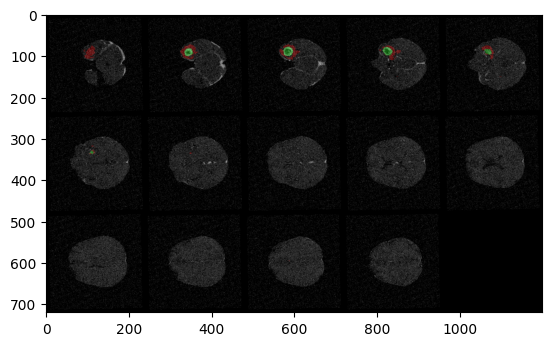

In [23]:
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]

color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 0.7*color_img + 0.3*color_mask
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
plt.imshow(montage(slices, channel_axis=3, grid_shape=(3,5)), cmap='gray')
plt.show()

In [24]:
import networkx as nx
from skimage.measure import regionprops
from skimage.color import rgb2gray
def making_graph(image, segments, segments_to_highlight,list_of_labels):
        G = nx.Graph()
        for segVal in segments_to_highlight:
            area = np.sum(segments == segVal)
            noice=0
            intensity = np.mean(image[segments == segVal])
            if segVal in list_of_labels:
                noice=1
            G.add_node(segVal, area=area, intensity=intensity,lable=noice)

        for i, j in np.argwhere(np.isin(segments, segments_to_highlight)):
            window = segments[max(0, i - 1):i + 2, max(0, j - 1):j + 2]
            neighbors = np.unique(window)
            
            for k in range(len(neighbors)):
                for l in range(k + 1, len(neighbors)):
                    if neighbors[l] in segments_to_highlight and neighbors[k] in segments_to_highlight:
                        if G.has_edge(neighbors[k], neighbors[l]):
                            G[neighbors[k]][neighbors[l]]['weight'] += 1
                        else:
                            G.add_edge(neighbors[k], neighbors[l], weight=1)
        return G

In [25]:
def average_color(image, segments):
    unique_segments = np.unique(segments)
    avg=0
    for segment_val in unique_segments:
        segment_mask = np.where(segments == segment_val, 1, 0)


        segment_average_color = np.mean(image[segment_mask == 1], axis=0)
        # print(f"Average color of segment {segment_val}: {segment_average_color[1]}")
        avg+=segment_average_color[1]
    return avg/len(unique_segments)


In [26]:
def high(unique_segments,highlighted_image,segments,avg):
    ele_seg=[]
    for i in range(len(unique_segments)):
        segment_mask = np.where(segments == unique_segments[i], 1, 0)
        segment_average_color = np.mean(highlighted_image[segment_mask == 1], axis=0)
        if segment_average_color[1]>avg:
            ele_seg.append(i+1)
            l.append(segment_average_color[1])
    return ele_seg

In [27]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
# shape=color_img.shape
for i in range(2):
    # color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 0.7*color_img + 0.3*color_mask 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 200
graph=[]
for i, slice in enumerate(slices):
    
    segments = slic(slice, n_segments=numSegments, sigma=2)
    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)
    segments_to_highlight = high(unique_segments,slice,segments,avg)
    graph.append(making_graph(slice, segments,segments_to_highlight))
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(slice)
    plt.axis("off")
    plt.show()

TypeError: making_graph() missing 1 required positional argument: 'list_of_labels'

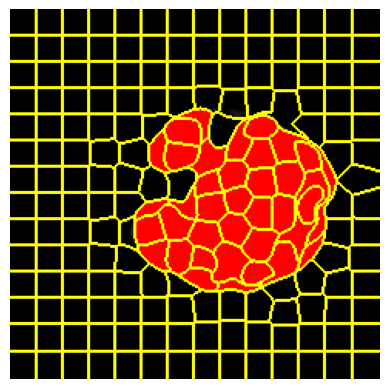

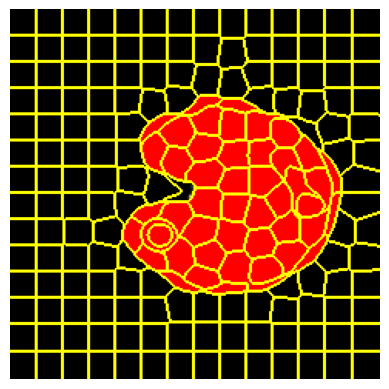

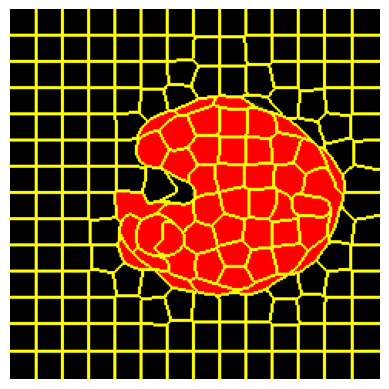

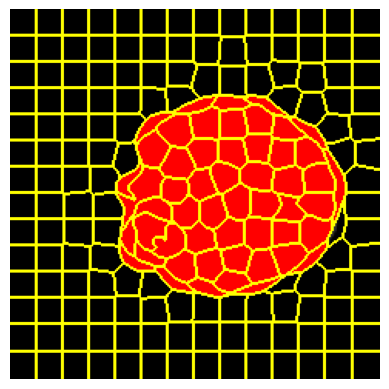

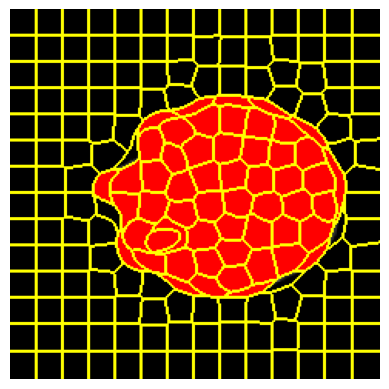

...

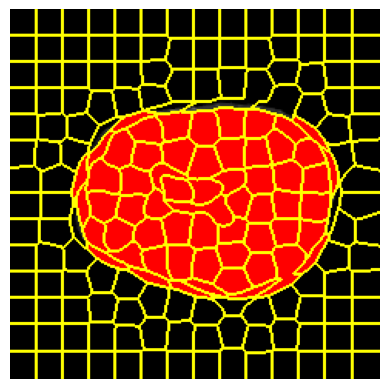

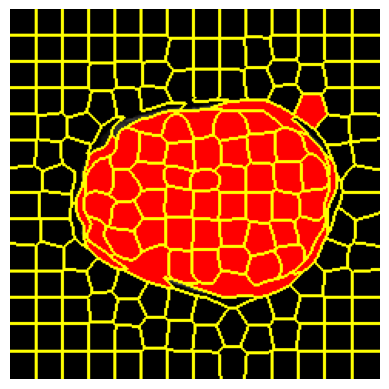

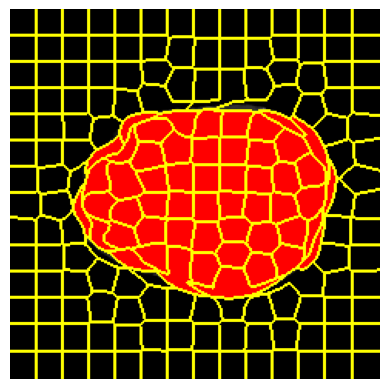

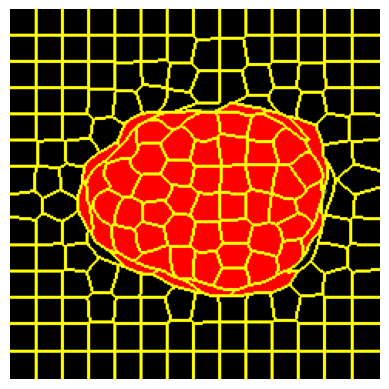

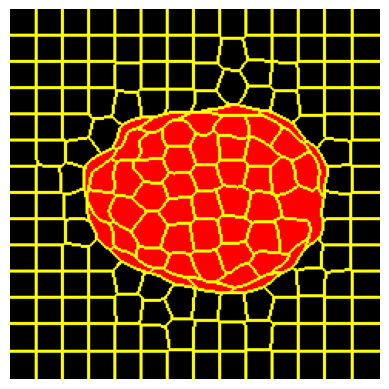

In [28]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
shape=color_img.shape
for i in range(2):
    color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 1*color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 200
graph=[]
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=4)
    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)
    segments_to_highlight = high(unique_segments,slice,segments,avg)
    l=[]
    graph.append(making_graph(slice, segments,segments_to_highlight,l))
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    highlol=highlight_segments(slice, segments, segments_to_highlight)
    ax.imshow(mark_boundaries(highlol, segments))
    plt.axis("off")
    plt.show()

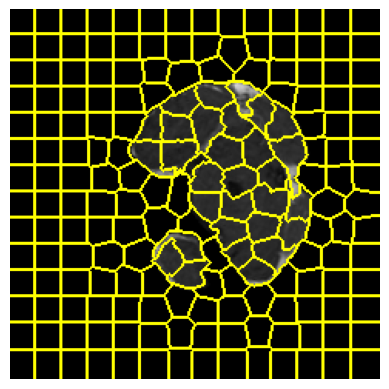

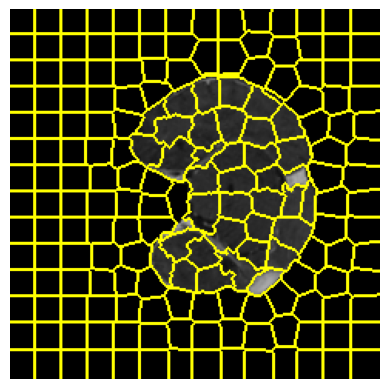

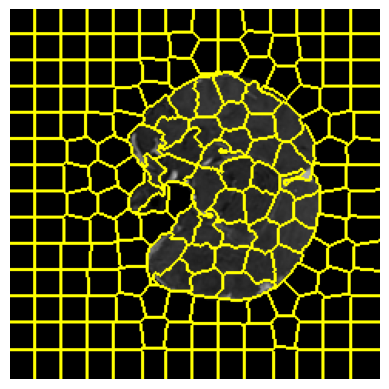

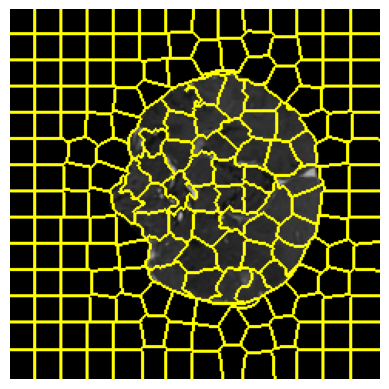

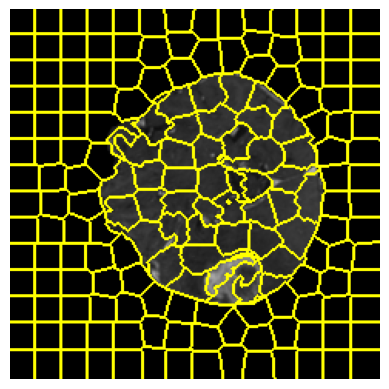

...

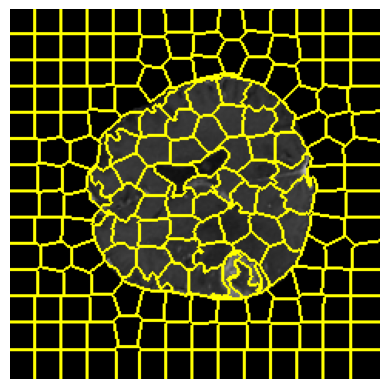

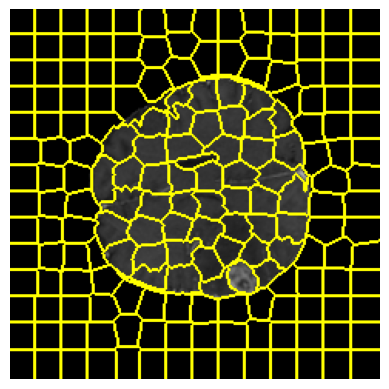

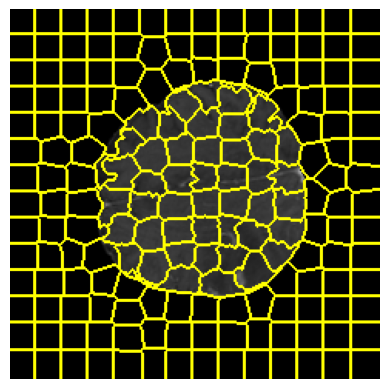

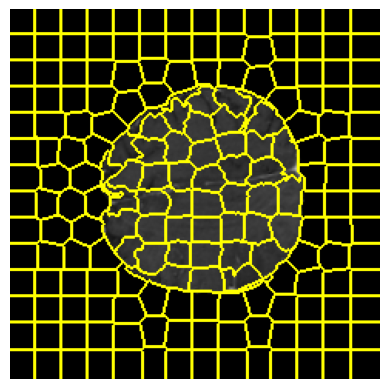

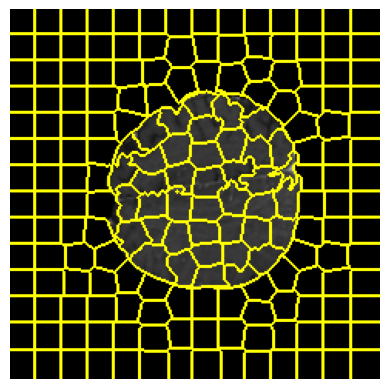

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
from skimage.morphology import dilation

import matplotlib.pyplot as plt
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
shape=color_img.shape
for i in range(2):
    color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0,1].cpu().detach().numpy()

mixed = color_img   
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 200
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=1)

    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    segments_dilated = dilation(segments)

    ax.imshow(mark_boundaries(slice, segments_dilated))
    plt.axis("off")
    plt.show()

torch.Size([1, 1, 240, 240, 155])
torch.Size([1, 2, 240, 240, 155])
(35, 240, 240, 3)
(2, 240, 35, 155)


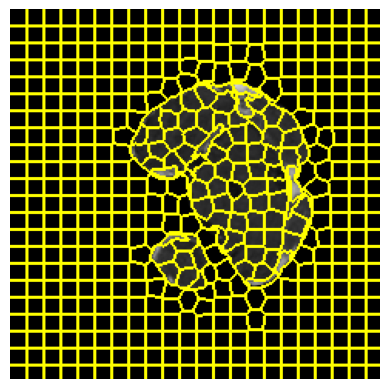

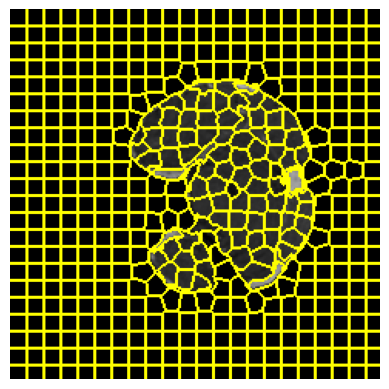

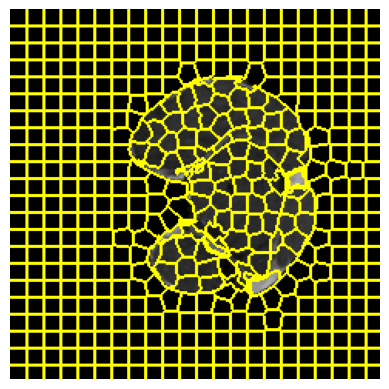

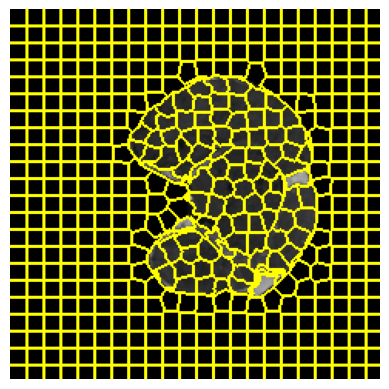

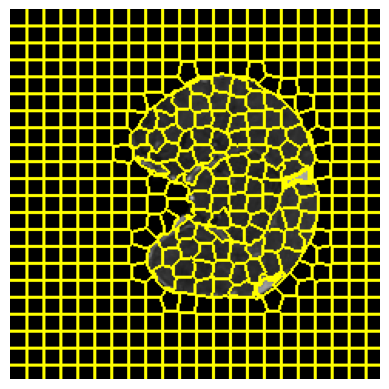

...

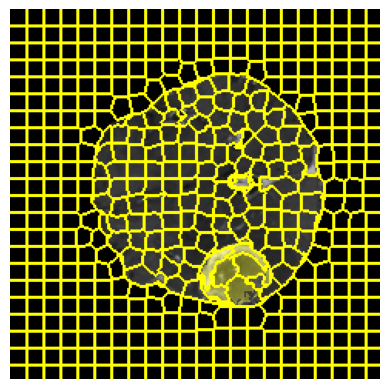

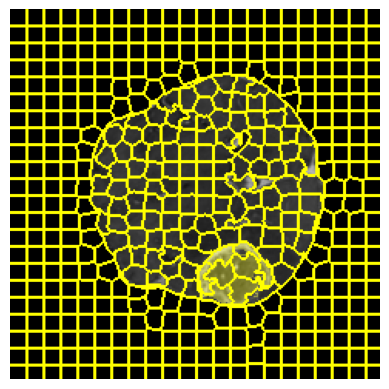

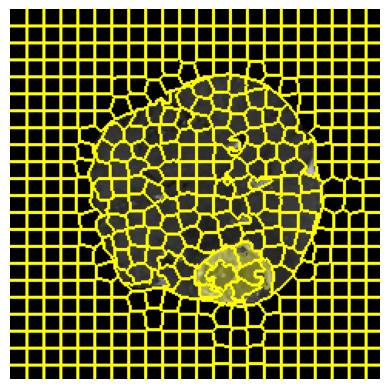

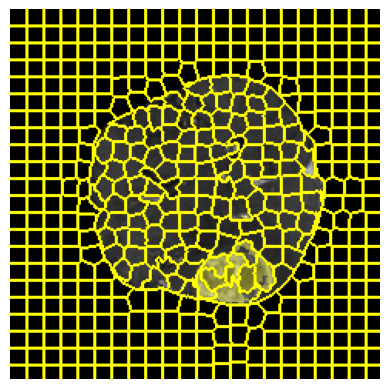

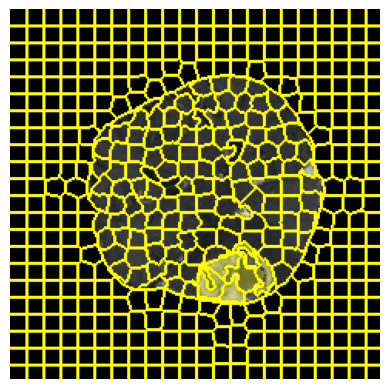

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


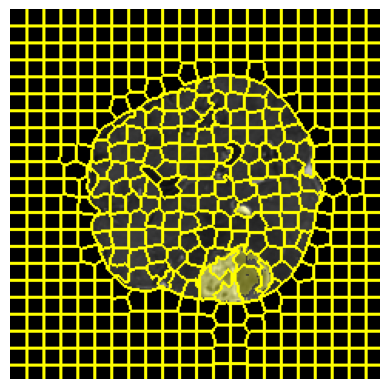

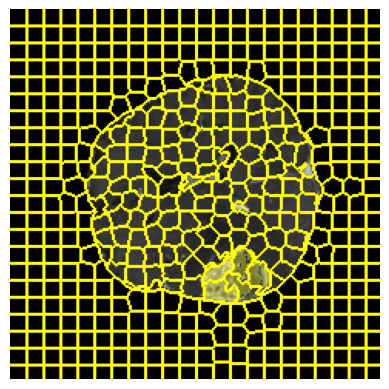

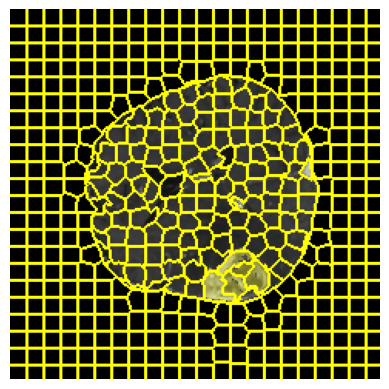

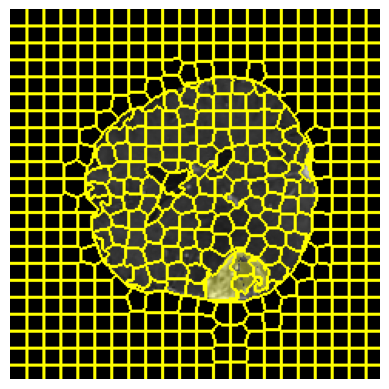

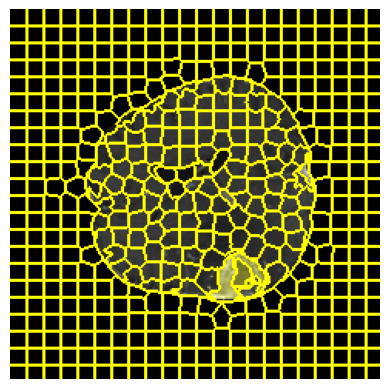

...

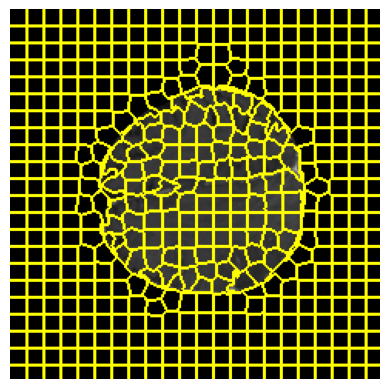

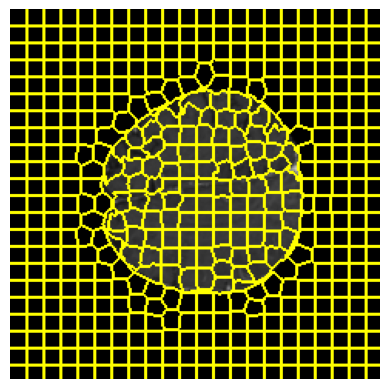

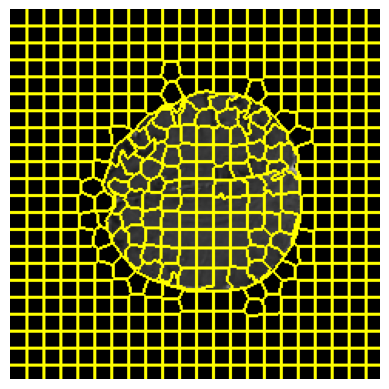

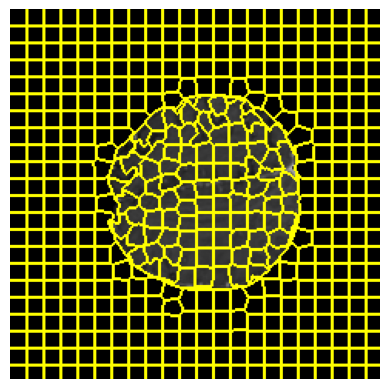

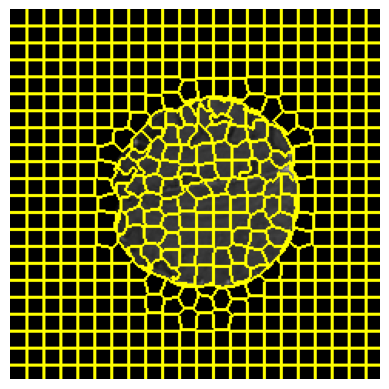

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
# train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
print(x.shape)
print(y.shape)
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0,1].cpu().detach().numpy()

mixed = color_img + 0.3*color_mask
slices = np.stack(mixed[0, ..., range(40, 110, 2), :], axis=0)
print(slices.shape)
print(np.stack(y[0, ..., range(40, 110, 2), :], axis=0).shape)
numSegments = 500
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=1)

    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(mark_boundaries(slice, segments))
    plt.axis("off")
    plt.show()

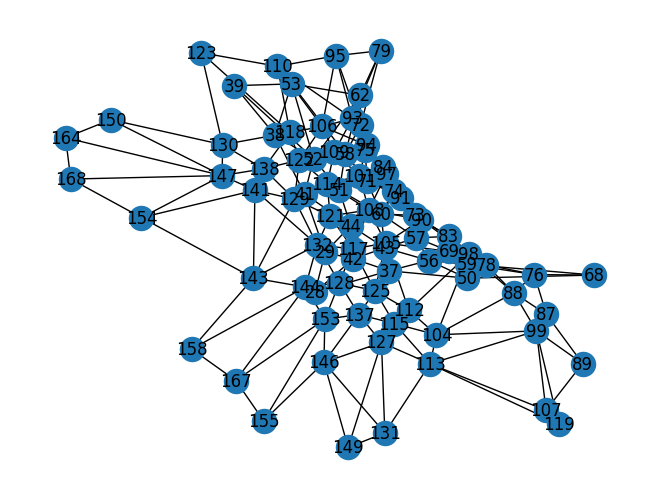

In [ ]:
import matplotlib.pyplot as plt

# Draw the graph
nx.draw(graph[0], with_labels=True)

# Show the plot
plt.show()

In [ ]:
train_sample = next(iter(train_dataloader))


In [30]:
def labeled_segments(segments, label_slice, overlap_threshold=0.5):
    overlapping_segments = []

    # Iterate over unique segment IDs
    for segment_id in np.unique(segments):
        # Create a mask for the current segment
        segment_mask = segments == segment_id

        # Calculate the overlap ratio
        overlap_ratio = np.sum(label_slice[segment_mask]) / np.sum(segment_mask)

        # Check if the overlap ratio is above the threshold
        if overlap_ratio > overlap_threshold:
            overlapping_segments.append(segment_id)

    return overlapping_segments

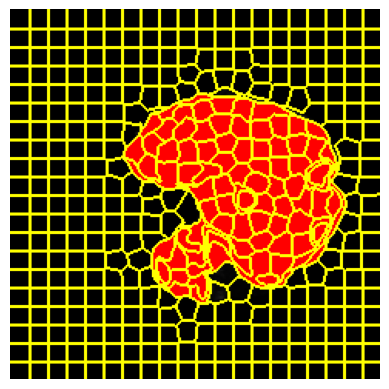

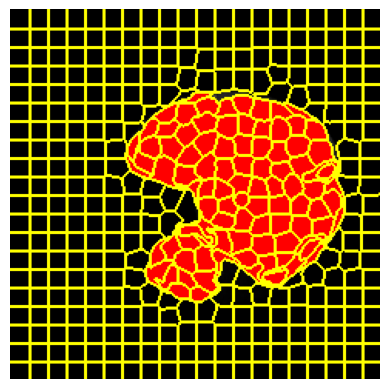

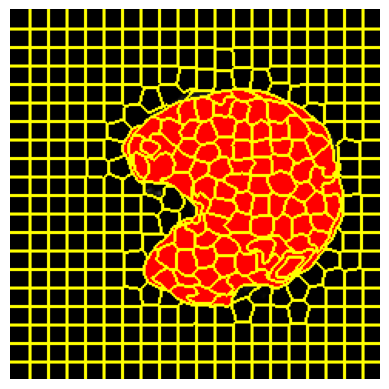

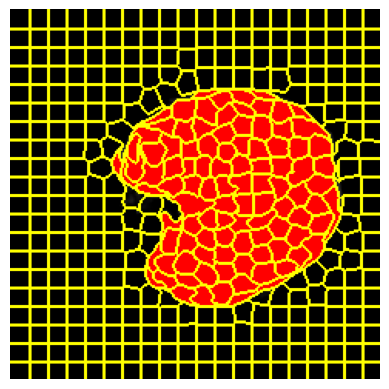

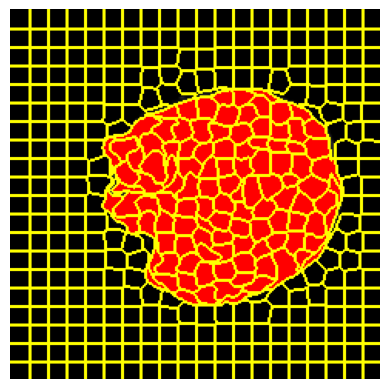

...

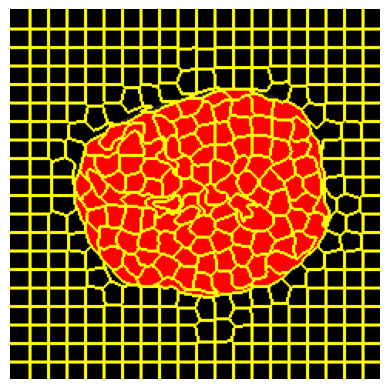

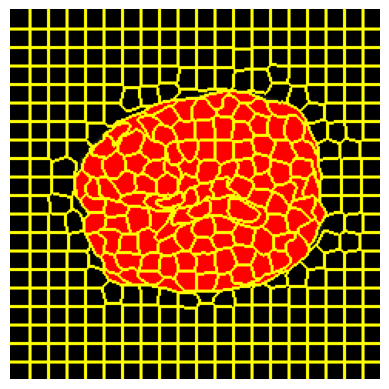

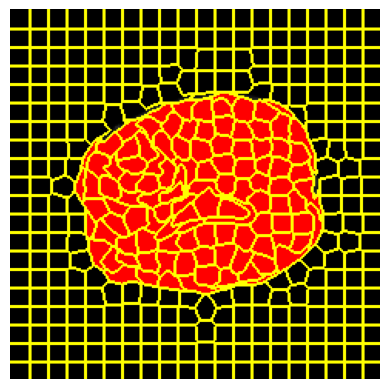

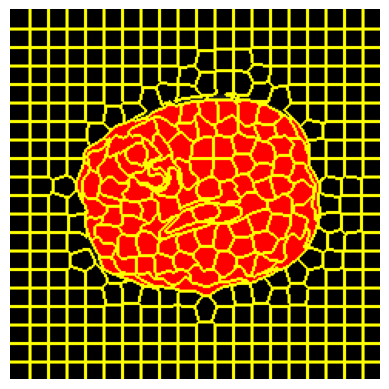

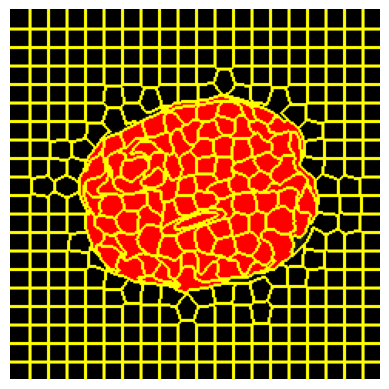

In [28]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
# train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
shape=color_img.shape
for i in range(2):
    color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 1*color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 400
graph=[]
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=2)
    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)
    segments_to_highlight = high(unique_segments,slice,segments,avg)
    l=[]
    graph.append(making_graph(slice, segments,segments_to_highlight,l))
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    highlol=highlight_segments(slice, segments, segments_to_highlight)
    ax.imshow(mark_boundaries(highlol, segments))
    plt.axis("off")
    plt.show()

In [48]:
graph=[]


(14, 240, 240, 3)
(14, 240, 240, 2)
14
14


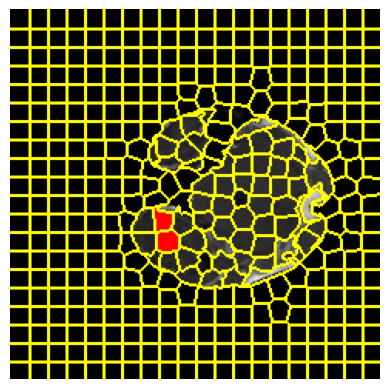

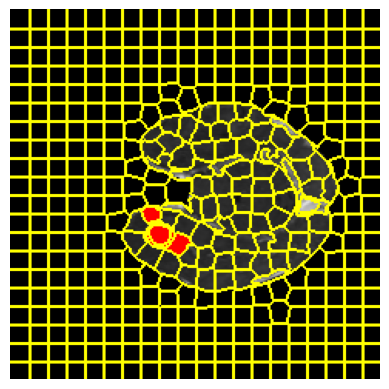

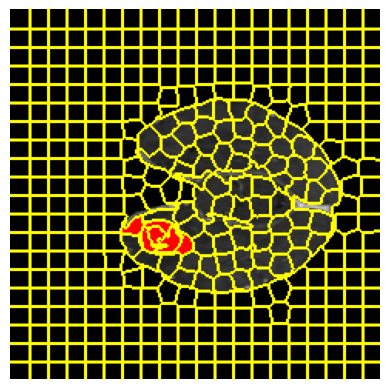

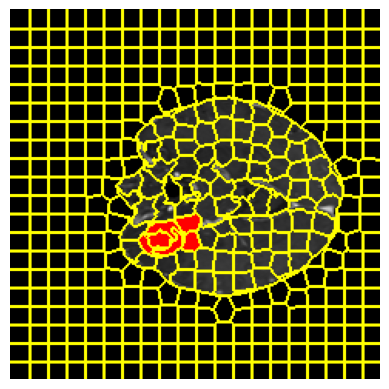

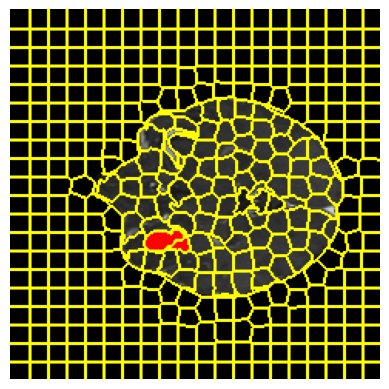

...

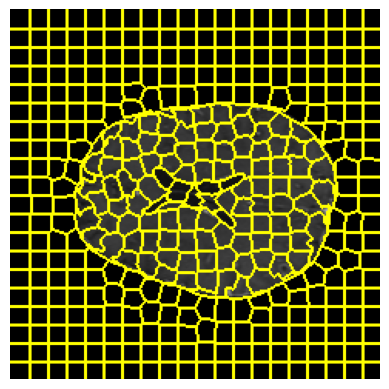

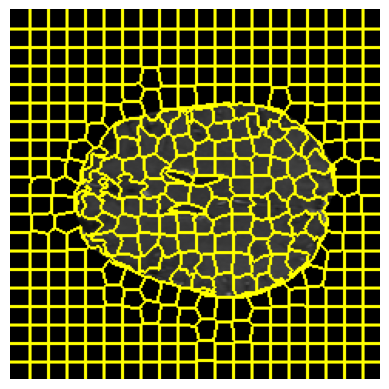

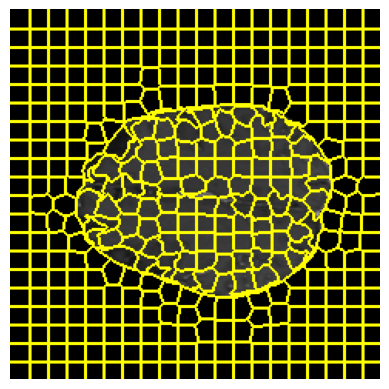

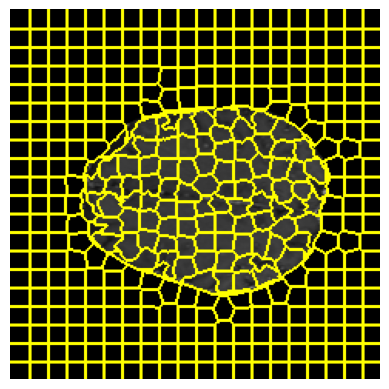

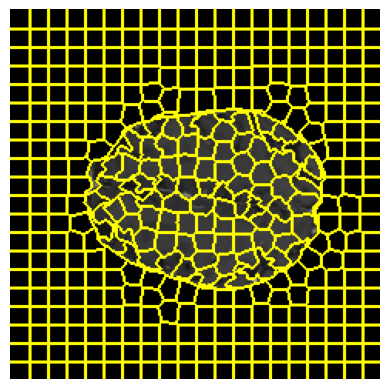

In [49]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
x = train_sample['image'][tio.DATA]

y = train_sample['label'][tio.DATA]

color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0,i].cpu().detach().numpy()

mixed = color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
slices.shape
numSegments = 375
label_slices = np.stack(y[0, ..., range(40, 110, 5)], axis=0)
label_slices = np.transpose(label_slices, (3, 1, 2, 0))
print(slices.shape)
print(label_slices.shape)
print(len(slices))
print(len(label_slices))

for i, (slice, label_slice) in enumerate(zip(slices, label_slices)):
    
    segments = slic(slice, n_segments=numSegments, sigma=1)

    

    labled_stuff=labeled_segments(segments,label_slice,0.65)
    slice2=highlight_segments(slice, segments, labled_stuff)

    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)  
    
    segments_to_highlight = high(unique_segments,slice,segments,avg)

    graph.append(making_graph(slice, segments,segments_to_highlight,labled_stuff))


    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(mark_boundaries(slice2, segments))
    plt.axis("off")
    plt.show()

In [80]:
for i in graph[10].nodes(data=True):
    print(i)

(127, {'area': 250, 'intensity': 0.06628473, 'lable': 0})
(129, {'area': 81, 'intensity': 0.20141229, 'lable': 0})
(130, {'area': 106, 'intensity': 0.30567247, 'lable': 0})
(131, {'area': 101, 'intensity': 0.28444645, 'lable': 0})
(132, {'area': 123, 'intensity': 0.26451984, 'lable': 0})
(133, {'area': 108, 'intensity': 0.22367817, 'lable': 0})
(134, {'area': 123, 'intensity': 0.2511836, 'lable': 0})
(135, {'area': 72, 'intensity': 0.08544036, 'lable': 0})
(136, {'area': 108, 'intensity': 0.21533763, 'lable': 0})
(149, {'area': 102, 'intensity': 0.31808093, 'lable': 0})
(150, {'area': 154, 'intensity': 0.31871772, 'lable': 0})
(151, {'area': 113, 'intensity': 0.19518098, 'lable': 0})
(152, {'area': 140, 'intensity': 0.32184458, 'lable': 0})
(153, {'area': 126, 'intensity': 0.34113857, 'lable': 0})
(154, {'area': 127, 'intensity': 0.20683083, 'lable': 0})
(155, {'area': 119, 'intensity': 0.2353236, 'lable': 0})
(156, {'area': 157, 'intensity': 0.24039668, 'lable': 0})
(157, {'area': 109

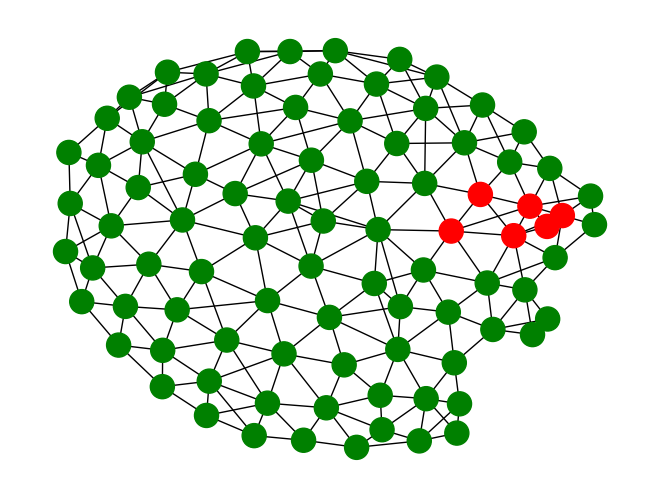

In [55]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming G is your graph
colors = ['red' if graph[3].nodes[n].get('lable') == 1 else 'green' for n in graph[3].nodes]
nx.draw(graph[3], node_color=colors)
plt.show()

In [127]:
graph=[]

In [128]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
for j in range(200):
    print(j)
    train_sample = next(iter(train_dataloader))

    x = train_sample['image'][tio.DATA]

    y = train_sample['label'][tio.DATA]

    color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
    for i in range(2):
        color_mask[0, :, :, :, i] = y[0,i].cpu().detach().numpy()

    mixed = color_img 
    slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
    slices.shape
    numSegments = 500
    label_slices = np.stack(y[0, ..., range(40, 110, 5)], axis=0)
    label_slices = np.transpose(label_slices, (3, 1, 2, 0))


    for i, (slice, label_slice) in enumerate(zip(slices, label_slices)):
        
        segments = slic(slice, n_segments=numSegments, sigma=2)

        

        labled_stuff=labeled_segments(segments,label_slice,0.6)
        slice2=highlight_segments(slice, segments, labled_stuff)

        unique_segments = np.unique(segments)
        avg=average_color(slice, segments)  
        
        segments_to_highlight = high(unique_segments,slice,segments,avg)

        graph.append(making_graph(slice, segments,segments_to_highlight,labled_stuff))


        # fig = plt.figure("Superpixels -- %d segments" % (numSegments))
        # ax = fig.add_subplot(1, 1, 1)
        # ax.imshow(mark_boundaries(slice2, segments))
        # plt.axis("off")
        # plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


this was preprocessing

now model time

In [130]:
# Define GCN model
class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        #self.conv3 = GCNConv(hidden_channels, hidden_channels)
        self.conv4 = GCNConv(hidden_channels, out_channels)
        
    def forward(self, x, edge_index):
        x = F.dropout(x, training=self.training)
        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, training=self.training)
        x = F.relu(self.conv2(x, edge_index))
        #x = F.dropout(x, training=self.training)
       # x = F.relu(self.conv3(x, edge_index))
        x = F.dropout(x, training=self.training)
        x = self.conv4(x, edge_index)
        return F.log_softmax(x, dim=1)

# GraphSAGE

In [131]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv

class GAT(nn.Module):
    def __init__(self, in_channels, out_channels, heads):
        super(GAT, self).__init__()
        self.conv1 = GATConv(in_channels, out_channels, heads=heads)
        self.conv2 = GATConv(out_channels*heads, dataset.num_classes, heads=1)

    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.6, training=self.training)
        x = F.elu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)
     


In [3]:
import torch
from torch_geometric.nn import SAGEConv
import torch.nn.functional as F
class GraphSAGE(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.5, training=self.training)
        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv

class GAT(nn.Module):
    def __init__(self, in_channels, out_channels, heads):
        super(GAT, self).__init__()
        self.conv1 = GATConv(in_channels, out_channels, heads=heads)
        self.conv2 = GATConv(out_channels*heads, dataset.num_classes, heads=1)

    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.6, training=self.training)
        x = F.elu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)
     


In [129]:
# from torch_geometric.nn import global_mean_pool, SAGEConv
# import torch.nn.functional as F

# class GraphSAGE(torch.nn.Module):
#     def __init__(self, in_channels, hidden_channels, out_channels):
#         super(GraphSAGE, self).__init__()
#         self.conv1 = SAGEConv(in_channels, hidden_channels)
#         self.conv2 = SAGEConv(hidden_channels, hidden_channels)  # Keep as hidden_channels
#         self.fc = torch.nn.Linear(hidden_channels, out_channels)  # out_channels for graph-level prediction

#     def forward(self, x, edge_index, batch_index):
#         x = F.dropout(x, p=0.5, training=self.training)
#         x = F.relu(self.conv1(x, edge_index))
#         x = F.dropout(x, p=0.5, training=self.training)
#         x = self.conv2(x, edge_index)

#         # Aggregate node embeddings to get a single graph embedding
#         x = global_mean_pool(x, batch_index)  # batch_index indicates to which graph a node belongs

#         x = self.fc(x)  # Final prediction for the graph
#         return x

In [135]:
model = GraphSAGE(2, 16, 2)

# Define the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

In [94]:
import pickle

with open('graph.pkl', 'wb') as f:
    pickle.dump(graph, f)

In [ ]:
with open('graph.pkl', 'rb') as f:
    graph = pickle.load(f)

In [82]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()


In [136]:
for g in graph:

    g.x = torch.tensor([[normal_data_area, normal_data_intensity] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.y = torch.tensor([data['lable'] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.edge_attr = torch.tensor([data['weight'] for _, _, data in g.edges(data=True)], dtype=torch.float)

NameError: name 'normal_data_area' is not defined

In [137]:
for g in graph:
    g.x = torch.tensor([[data['area'], data['intensity']] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.y = torch.tensor([data['lable'] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.edge_attr = torch.tensor([data['weight'] for _, _, data in g.edges(data=True)], dtype=torch.float)

In [90]:
from sklearn.preprocessing import StandardScaler
import torch

for g in graph:
    # Extract area and intensity values for all nodes in the current graph
    areas = [data['area'] for _, data in g.nodes(data=True)]
    intensities = [data['intensity'] for _, data in g.nodes(data=True)]
    
    # Convert lists to a format suitable for the scaler (2D array)
    areas = np.array(areas).reshape(-1, 1)
    intensities = np.array(intensities).reshape(-1, 1)
    
    # Initialize scalers
    scaler_area = StandardScaler()
    scaler_intensity = StandardScaler()
    
    # Fit and transform the data
    normalized_areas = scaler_area.fit_transform(areas)
    normalized_intensities = scaler_intensity.fit_transform(intensities)
    
    # Combine normalized features and convert to tensor
    g.x = torch.tensor(np.hstack((normalized_areas, normalized_intensities)), dtype=torch.float)
    
    # Assuming 'lable' is a typo and should be 'label'
    g.y = torch.tensor([data['lable'] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.edge_attr = torch.tensor([data['weight'] for _, _, data in g.edges(data=True)], dtype=torch.float)

In [138]:
g2=[]

In [139]:
for g in graph:
    g.x = torch.tensor([[data['area'], data['intensity']] for _, data in g.nodes(data=True)], dtype=torch.float)
    # print(g.x)
    g.y = torch.tensor([data['lable'] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.edge_attr = torch.tensor([data['weight'] for _, _, data in g.edges(data=True)], dtype=torch.float)
    print(g.edge_attr)
    
    g2.append(g)

tensor([ 95.,  34.,  26.,  50.,  13.,  33.,  36.,   2.,  20.,  26.,  26.,  22.,
         20.,  32.,   8.,  17.,  14.,  30.,  39.,  26.,   8.,  22.,  26.,  24.,
          1.,  24.,  26.,  24.,  30.,  26.,   8.,  20.,  17.,  32.,  30.,  18.,
         28.,  23.,  22.,  18.,  19.,  29.,  31.,  12.,  26.,  16.,  10.,  28.,
         24.,  26.,  26.,  26.,  22.,  27.,  28.,  12.,  26.,  10.,  27.,  14.,
         38.,  30.,  24.,  28.,  14.,  24.,  26.,  10.,  26.,  23.,  26.,   8.,
         18.,  24.,  24.,  11.,  25.,  30.,  30.,  18.,  25.,  24.,  26.,  27.,
         29.,  10.,   2.,  22.,  24.,  25.,   2.,  24.,  18.,  26.,  22.,  24.,
         25.,  14.,  14.,  23.,  15.,  18.,  20.,  24.,  28.,  30.,   8.,  36.,
         51.,  36.,  28.,  28.,   6.,  34.,  10.,  28.,   6.,  14.,  20.,  22.,
         22.,  24.,   2.,  23.,   6.,  28.,  14.,  23.,  32.,  18.,   2.,  26.,
          5.,  32.,  18.,  44.,  30.,   3.,   7.,  14.,  61.,  18.,  38.,  22.,
         26.,  19.,  26.,  21.,  23.,  2

In [111]:
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx

# Convert NetworkX graphs to PyG graphs
pyg_graphs = [from_networkx(g) for g in graph]


In [140]:
for g in pyg_graphs:
    print(g)

Data(edge_index=[2, 546], area=[95], intensity=[95], lable=[95], weight=[546], num_nodes=95)
Data(edge_index=[2, 618], area=[105], intensity=[105], lable=[105], weight=[618], num_nodes=105)
Data(edge_index=[2, 698], area=[116], intensity=[116], lable=[116], weight=[698], num_nodes=116)
Data(edge_index=[2, 774], area=[127], intensity=[127], lable=[127], weight=[774], num_nodes=127)
Data(edge_index=[2, 822], area=[134], intensity=[134], lable=[134], weight=[822], num_nodes=134)
Data(edge_index=[2, 874], area=[141], intensity=[141], lable=[141], weight=[874], num_nodes=141)
Data(edge_index=[2, 856], area=[141], intensity=[141], lable=[141], weight=[856], num_nodes=141)
Data(edge_index=[2, 918], area=[145], intensity=[145], lable=[145], weight=[918], num_nodes=145)
Data(edge_index=[2, 924], area=[148], intensity=[148], lable=[148], weight=[924], num_nodes=148)
Data(edge_index=[2, 898], area=[144], intensity=[144], lable=[144], weight=[898], num_nodes=144)
Data(edge_index=[2, 876], area=[13

In [142]:
a=pyg_graphs[10]
a.intensity
a.area
x = torch.stack((a.intensity, a.area), dim=1)
y=a.lable

In [143]:
x


tensor([[1.6077e-01, 9.4000e+01],
        [2.2138e-01, 1.4500e+02],
        [1.5172e-01, 1.4700e+02],
        [2.1376e-01, 1.4900e+02],
        [1.7655e-01, 1.7400e+02],
        [2.2215e-01, 1.3300e+02],
        [1.7386e-01, 1.1800e+02],
        [1.3942e-01, 5.9000e+01],
        [5.9236e-02, 1.4400e+02],
        [2.0977e-01, 1.3600e+02],
        [2.0097e-01, 1.4400e+02],
        [2.0732e-01, 1.5400e+02],
        [1.1721e-01, 6.2000e+01],
        [2.0989e-01, 1.3000e+02],
        [1.5936e-01, 1.4900e+02],
        [1.9854e-01, 1.3200e+02],
        [2.1100e-01, 1.3000e+02],
        [2.1291e-01, 1.2000e+02],
        [1.8760e-01, 1.1700e+02],
        [1.8606e-01, 1.9700e+02],
        [2.0213e-01, 1.2100e+02],
        [2.3283e-01, 1.4400e+02],
        [1.9536e-01, 1.4400e+02],
        [2.2684e-01, 1.1000e+02],
        [2.2588e-01, 1.3300e+02],
        [9.5285e-02, 6.1000e+01],
        [2.0152e-01, 1.3000e+02],
        [1.6716e-01, 1.3100e+02],
        [2.0297e-01, 1.1600e+02],
        [2.219

In [144]:
type(a)

torch_geometric.data.data.Data

In [145]:
print(a.lable)

tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])


In [149]:
model = GraphSAGE(2, 16, 2)

# Define the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

In [150]:
model.train()
for i in range(5):
    for g in pyg_graphs:
        x = torch.stack((g.intensity, g.area), dim=1)

        y = torch.tensor([1.0 if 1 in g.lable else 0.0]).float()
        optimizer.zero_grad()
        out = model(x, g.edge_index)
        loss = criterion(out.squeeze(), y)  # Squeeze out to match y's shape if necessary
        print(f"loss:{loss}, epoch:{i}")
        loss.backward()
        optimizer.step()

ValueError: Expected input batch_size (95) to match target batch_size (1).

In [155]:
out = model(x, g.edge_index)


In [156]:
out

tensor([[-1.1412e+01, -1.1086e-05],
        [-9.3504e+01,  0.0000e+00],
        [-1.8034e+02,  0.0000e+00],
        [-2.0125e-01, -1.7022e+00],
        [ 0.0000e+00, -6.6799e+01],
        [-3.0571e+01,  0.0000e+00],
        [-2.0429e+01,  0.0000e+00],
        [-1.6398e+02,  0.0000e+00],
        [-1.1483e+01, -1.0252e-05],
        [-9.8067e+00, -5.5073e-05],
        [-9.2919e+01,  0.0000e+00],
        [ 0.0000e+00, -4.7185e+01],
        [ 0.0000e+00, -2.7863e+01],
        [-1.6291e+02,  0.0000e+00],
        [ 0.0000e+00, -8.1344e+01],
        [-5.6491e+01,  0.0000e+00],
        [-1.3513e+01, -1.3113e-06],
        [-7.0430e+01,  0.0000e+00],
        [-7.5374e+01,  0.0000e+00],
        [ 0.0000e+00, -1.6705e+02],
        [ 0.0000e+00, -1.4110e+02],
        [-5.0664e+01,  0.0000e+00],
        [-1.0300e+02,  0.0000e+00],
        [ 0.0000e+00, -5.6684e+01],
        [-1.2624e+02,  0.0000e+00],
        [ 0.0000e+00, -6.0571e+01],
        [-6.3424e+01,  0.0000e+00],
        [ 0.0000e+00, -9.052

In [152]:
y

tensor([1.])

In [153]:
print(out)

tensor([[ 0.0000e+00, -1.7935e+01],
        [ 0.0000e+00, -1.1193e+02],
        [ 0.0000e+00, -1.8633e+02],
        [-1.3842e+02,  0.0000e+00],
        [-2.3842e-07, -1.5188e+01],
        [ 0.0000e+00, -3.4929e+01],
        [-7.6039e-04, -7.1820e+00],
        [ 0.0000e+00, -1.5179e+02],
        [-1.9658e+02,  0.0000e+00],
        [ 0.0000e+00, -5.6526e+01],
        [-1.5831e+02,  0.0000e+00],
        [ 0.0000e+00, -7.2580e+01],
        [-1.6472e+02,  0.0000e+00],
        [-1.5426e+02,  0.0000e+00],
        [ 0.0000e+00, -4.4799e+01],
        [ 0.0000e+00, -1.9518e+01],
        [ 0.0000e+00, -1.1124e+02],
        [-4.3917e+01,  0.0000e+00],
        [-1.6017e+02,  0.0000e+00],
        [-2.0308e+02,  0.0000e+00],
        [-5.2452e-06, -1.2165e+01],
        [-9.5939e+01,  0.0000e+00],
        [-5.9836e+01,  0.0000e+00],
        [ 0.0000e+00, -8.3915e+01],
        [-1.2398e-05, -1.1300e+01],
        [-3.1329e+01,  0.0000e+00],
        [ 0.0000e+00, -2.5915e+01],
        [ 0.0000e+00, -1.789

flag


In [154]:
model = GraphSAGE(2, 32, 2)

In [121]:
import torch.optim as optim

criterion = torch.nn.BCEWithLogitsLoss()  # Adjust if your task is different
optimizer = optim.Adam(model.parameters(), lr=0.1)

In [122]:
model.train()
for i in range(5):
    for g in pyg_graphs:
        x = torch.stack((g.intensity, g.area), dim=1)
        y = g.lable
        optimizer.zero_grad()
        
        batch_index = torch.zeros(x.size(0), dtype=torch.long) 
        
        out = model(x, g.edge_index, batch_index) 
        
        loss = criterion(out, y)
        print(f"loss:{loss}, epoch:{i}")
        loss.backward()
        optimizer.step()

ValueError: Target size (torch.Size([95])) must be the same as input size (torch.Size([1, 2]))

In [123]:
model.train()
for i in range(5):
    for g in pyg_graphs:
        x = torch.stack((g.intensity, g.area), dim=1)
        

        y = torch.tensor([1.0 if 1 in g.lable else 0.0]).float()
        y = y.expand(x.size(0))  
        
        optimizer.zero_grad()
        out = model(x, g.edge_index)
        loss = criterion(out.squeeze(), y)  
        print(f"loss:{loss}, epoch:{i}")
        loss.backward()
        optimizer.step()

TypeError: forward() missing 1 required positional argument: 'batch_index'